## **Practical Lab 3 - Vanilla CNN and Fine-Tune VGG16 - for Dogs and Cats Classification**

### Name: Ashley sherry Kombarakaran Antony Babu
### Student Id:9015649
### Section: 2

### Importing Libraries

In [ ]:
import os, shutil, pathlib

from tensorflow import keras
from tensorflow.keras import layers
import pathlib
from tensorflow.keras.utils import image_dataset_from_directory
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from PIL import Image
from pathlib import Path
from sklearn.metrics import confusion_matrix, classification_report, precision_recall_curve, auc, ConfusionMatrixDisplay

batch_size: The number of samples per gradient update.

img_height and img_width: The dimensions to which the images will be resized.

image_dataset_from_directory: This function loads images from the directory structure and automatically labels them based on the subdirectories.

### Loading the data

In [ ]:
# This should point to the small dataset of the Kaggle Dogs vs Cats competition that was created in a previous notebook
data_folder = pathlib.Path("D:\\CSCN8010-LABS\\kaggle_dogs_vs_cats_small")


In [ ]:
train_dataset = image_dataset_from_directory(
    data_folder / "train",
    image_size=(180, 180),
    batch_size=32)
validation_dataset = image_dataset_from_directory(
    data_folder / "validation",
    image_size=(180, 180),
    batch_size=32)
test_dataset = image_dataset_from_directory(
    data_folder / "test",
    image_size=(180, 180),
    batch_size=32)

Found 2000 files belonging to 2 classes.
Found 1000 files belonging to 2 classes.
Found 2000 files belonging to 2 classes.


### EDA: Explore the data 

Found 2000 files belonging to 2 classes.
Found 1000 files belonging to 2 classes.
Found 2000 files belonging to 2 classes.


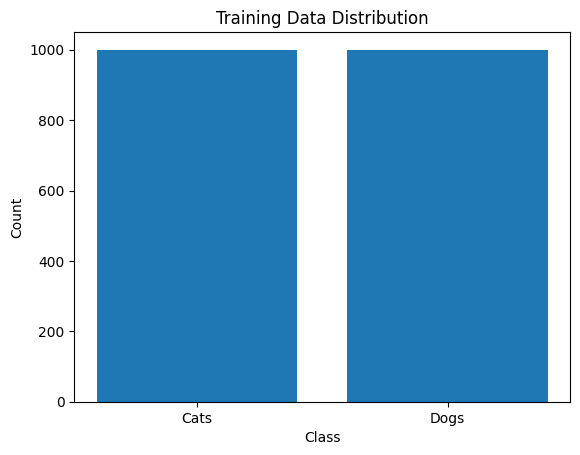

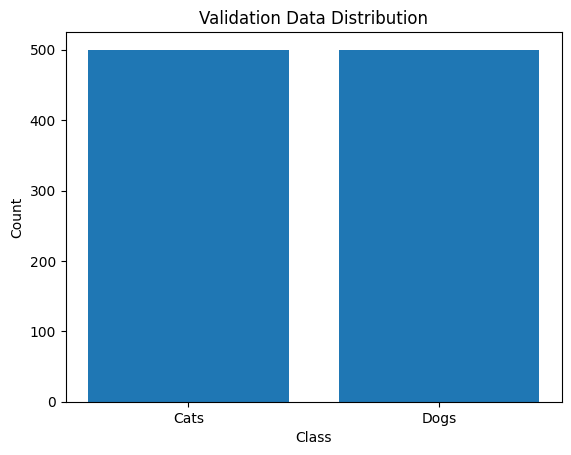

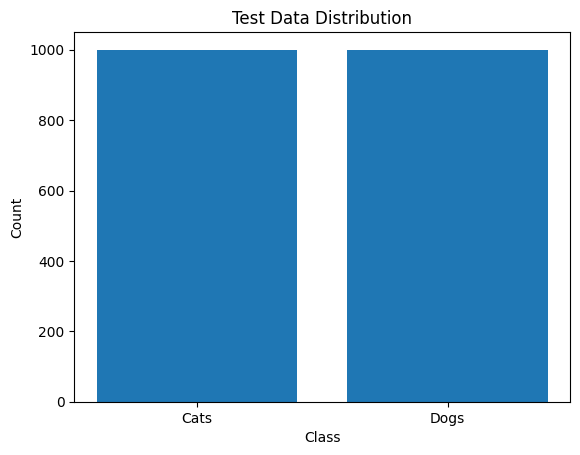

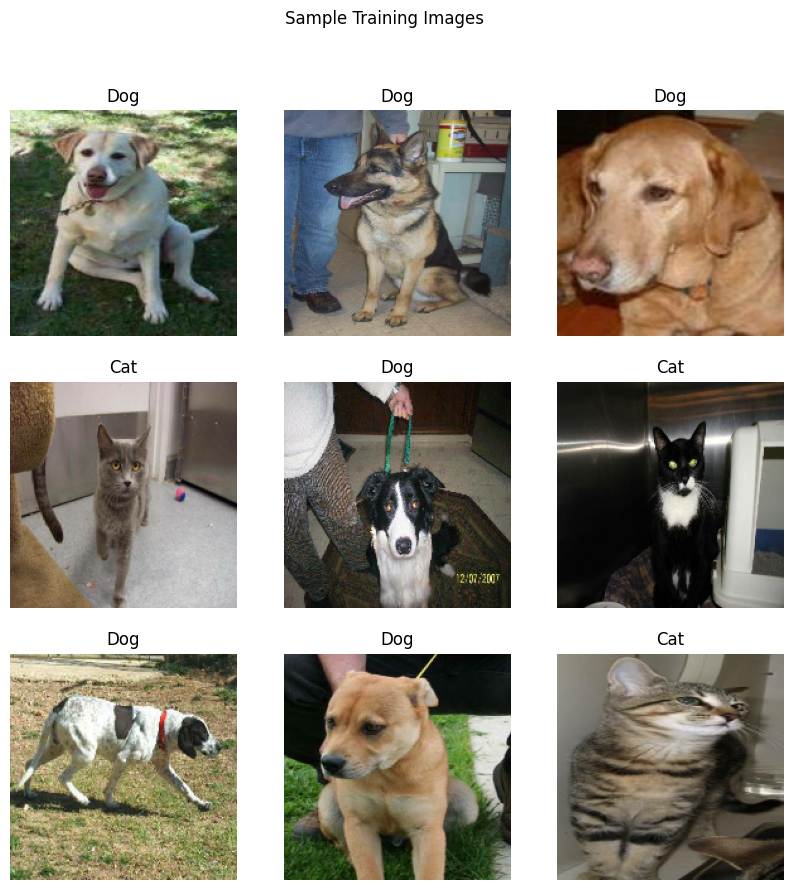

Training Data Mean Pixel Intensity: [0.48080638 0.4516345  0.409062  ]
Training Data Std. Dev. of Pixel Intensity: [0.25904176 0.25180757 0.25474995]
Validation Data Mean Pixel Intensity: [0.4875215  0.45641398 0.4116987 ]
Validation Data Std. Dev. of Pixel Intensity: [0.25802138 0.25197008 0.2550806 ]
Test Data Mean Pixel Intensity: [0.48553178 0.45734078 0.4133416 ]
Test Data Std. Dev. of Pixel Intensity: [0.2609459 0.2542641 0.2561265]


In [ ]:
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras.utils import image_dataset_from_directory
import numpy as np
from pathlib import Path

# Load datasets
data_folder = Path("D:\\CSCN8010-LABS\\kaggle_dogs_vs_cats_small")
train_dataset = image_dataset_from_directory(data_folder / "train", image_size=(180, 180), batch_size=32)
validation_dataset = image_dataset_from_directory(data_folder / "validation", image_size=(180, 180), batch_size=32)
test_dataset = image_dataset_from_directory(data_folder / "test", image_size=(180, 180), batch_size=32)

# 1. Explore class distribution
def plot_class_distribution(dataset, title):
    class_counts = {}
    for _, labels in dataset:
        unique, counts = np.unique(labels.numpy(), return_counts=True)
        for label, count in zip(unique, counts):
            class_counts[label] = class_counts.get(label, 0) + count
    plt.bar(class_counts.keys(), class_counts.values(), tick_label=["Cats", "Dogs"])
    plt.title(title)
    plt.xlabel("Class")
    plt.ylabel("Count")
    plt.show()

plot_class_distribution(train_dataset, "Training Data Distribution")
plot_class_distribution(validation_dataset, "Validation Data Distribution")
plot_class_distribution(test_dataset, "Test Data Distribution")

# 2. Display a few sample images
def display_images(dataset, title):
    plt.figure(figsize=(10, 10))
    for images, labels in dataset.take(1):
        for i in range(9):
            ax = plt.subplot(3, 3, i + 1)
            plt.imshow(images[i].numpy().astype("uint8"))
            plt.title("Dog" if labels[i] == 1 else "Cat")
            plt.axis("off")
    plt.suptitle(title)
    plt.show()

display_images(train_dataset, "Sample Training Images")

# 3. Statistics on Pixel Intensity
def compute_statistics(dataset, dataset_name):
    means, stds = [], []
    for images, _ in dataset:
        means.append(np.mean(images.numpy() / 255.0, axis=(0, 1, 2)))
        stds.append(np.std(images.numpy() / 255.0, axis=(0, 1, 2)))
    print(f"{dataset_name} Mean Pixel Intensity: {np.mean(means, axis=0)}")
    print(f"{dataset_name} Std. Dev. of Pixel Intensity: {np.mean(stds, axis=0)}")

compute_statistics(train_dataset, "Training Data")
compute_statistics(validation_dataset, "Validation Data")
compute_statistics(test_dataset, "Test Data")


### DEFINING THE MODEL CNN

In [ ]:
inputs = keras.Input(shape=(180, 180, 3))
x = layers.Rescaling(1./255)(inputs)
x = layers.Conv2D(filters=32, kernel_size=3, activation="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=64, kernel_size=3, activation="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=128, kernel_size=3, activation="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=256, kernel_size=3, activation="relu")(x)
x = layers.MaxPooling2D(pool_size=2)(x)
x = layers.Conv2D(filters=256, kernel_size=3, activation="relu")(x)
x = layers.Flatten()(x)
outputs = layers.Dense(1, activation="sigmoid")(x)
model = keras.Model(inputs=inputs, outputs=outputs)

In [ ]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 180, 180, 3)]     0         
                                                                 
 rescaling (Rescaling)       (None, 180, 180, 3)       0         
                                                                 
 conv2d (Conv2D)             (None, 178, 178, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 89, 89, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 87, 87, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 43, 43, 64)       0         
 2D)                                                         

### COMPILATION OF THE MODEL

In [ ]:
model.compile(loss="binary_crossentropy",
              optimizer="rmsprop",
              metrics=["accuracy"])

### CALL BACKS FOR THE COMPILATION OF THE SAME BEST MODEL

In [ ]:
callbacks = [
    keras.callbacks.ModelCheckpoint(
        filepath="./models/convnet_from_scratch.keras",
        save_best_only=True,
        monitor="val_loss")
]
history = model.fit(
    train_dataset,
    epochs=30,
    validation_data=validation_dataset,
    callbacks=callbacks)

Epoch 1/30
63/63 [==============================] - 33s 507ms/step - loss: 0.8017 - accuracy: 0.5080 - val_loss: 0.6923 - val_accuracy: 0.5510
Epoch 2/30
63/63 [==============================] - 31s 488ms/step - loss: 0.6917 - accuracy: 0.5325 - val_loss: 0.6915 - val_accuracy: 0.5060
Epoch 3/30
63/63 [==============================] - 30s 475ms/step - loss: 0.6917 - accuracy: 0.5520 - val_loss: 0.6741 - val_accuracy: 0.6060
Epoch 4/30
63/63 [==============================] - 30s 471ms/step - loss: 0.6714 - accuracy: 0.6035 - val_loss: 0.6704 - val_accuracy: 0.5770
Epoch 5/30
63/63 [==============================] - 30s 472ms/step - loss: 0.6418 - accuracy: 0.6450 - val_loss: 0.6623 - val_accuracy: 0.6100
Epoch 6/30
63/63 [==============================] - 30s 475ms/step - loss: 0.6224 - accuracy: 0.6680 - val_loss: 0.6079 - val_accuracy: 0.6640
Epoch 7/30
63/63 [==============================] - 30s 469ms/step - loss: 0.5746 - accuracy: 0.7110 - val_loss: 0.6124 - val_accuracy: 0.6250

### EVALUATING THE CNN MODEL

### Displaying the curves of loss of acuracy during the training

Epoch 1/10
63/63 [==============================] - 32s 502ms/step - loss: 0.0453 - accuracy: 0.9830 - val_loss: 2.2628 - val_accuracy: 0.7230
Epoch 2/10
63/63 [==============================] - 31s 497ms/step - loss: 0.0424 - accuracy: 0.9850 - val_loss: 2.5342 - val_accuracy: 0.7150
Epoch 3/10
63/63 [==============================] - 31s 495ms/step - loss: 0.0601 - accuracy: 0.9870 - val_loss: 1.7578 - val_accuracy: 0.7390
Epoch 4/10
63/63 [==============================] - 33s 523ms/step - loss: 0.0688 - accuracy: 0.9835 - val_loss: 2.2058 - val_accuracy: 0.6960
Epoch 5/10
63/63 [==============================] - 32s 503ms/step - loss: 0.0418 - accuracy: 0.9870 - val_loss: 2.3124 - val_accuracy: 0.7250
Epoch 6/10
63/63 [==============================] - 31s 495ms/step - loss: 0.0291 - accuracy: 0.9880 - val_loss: 2.4132 - val_accuracy: 0.7170
Epoch 7/10
63/63 [==============================] - 31s 491ms/step - loss: 0.0318 - accuracy: 0.9890 - val_loss: 2.5252 - val_accuracy: 0.7100

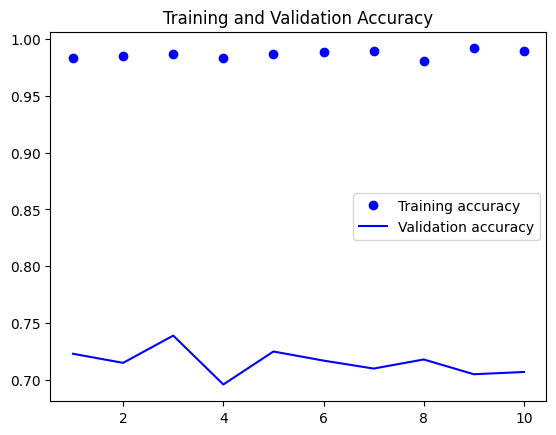

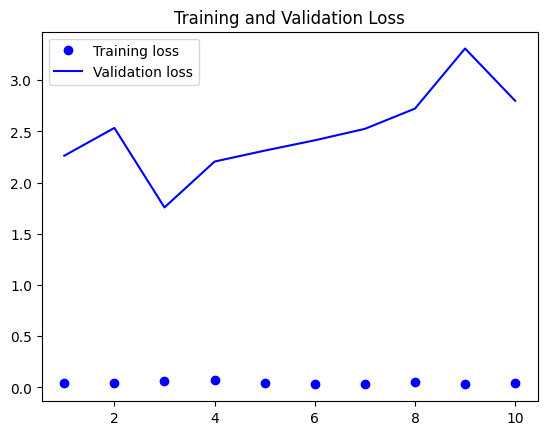

In [ ]:
import matplotlib.pyplot as plt

# Train the model and store the history
history = model.fit(
    train_dataset,
    validation_data=validation_dataset,
    epochs=10  # Number of epochs to train
)

# Extract accuracy and loss from the history object
accuracy = history.history["accuracy"]
val_accuracy = history.history["val_accuracy"]
loss = history.history["loss"]
val_loss = history.history["val_loss"]

# Create the epochs range
epochs = range(1, len(accuracy) + 1)

# Plot training and validation accuracy
plt.plot(epochs, accuracy, "bo", label="Training accuracy")
plt.plot(epochs, val_accuracy, "b", label="Validation accuracy")
plt.title("Training and Validation Accuracy")
plt.legend()
plt.figure()

# Plot training and validation loss
plt.plot(epochs, loss, "bo", label="Training loss")
plt.plot(epochs, val_loss, "b", label="Validation loss")
plt.title("Training and Validation Loss")
plt.legend()
plt.show()


### TEST ACUURACY

In [ ]:
test_model = keras.models.load_model("./models/convnet_from_scratch.keras")
test_loss, test_acc = test_model.evaluate(test_dataset)
print(f"Test accuracy: {test_acc:.3f}")

63/63 [==============================] - 7s 114ms/step - loss: 0.5888 - accuracy: 0.7015
Test accuracy: 0.701


In [ ]:
test_model = keras.models.load_model("./models/convnet_from_scratch.keras")
test_loss, test_acc = test_model.evaluate(test_dataset)
print(f"Test accuracy: {test_acc:.3f}")

63/63 [==============================] - 8s 118ms/step - loss: 0.5888 - accuracy: 0.7015
Test accuracy: 0.701


### Confusion - Matrix

1/1 [==============================] - 0s 109ms/step


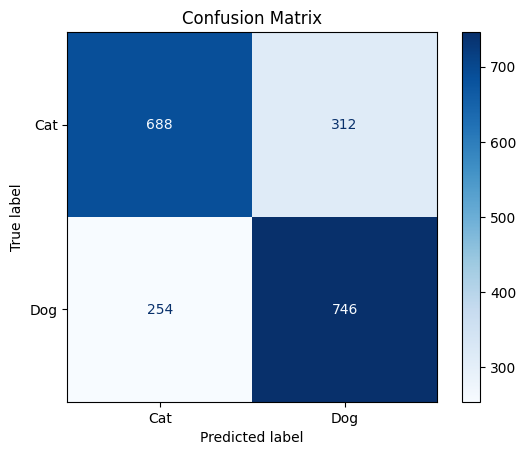

True Positives (Dogs correctly classified): 746
True Negatives (Cats correctly classified): 688
False Positives (Cats classified as Dogs): 312
False Negatives (Dogs classified as Cats): 254


In [ ]:
import tensorflow as tf
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import numpy as np
import matplotlib.pyplot as plt

# Assume the model is already trained
# model = ... (Your trained model)

# 1. Get actual labels and predictions
def get_actual_and_predicted_labels(model, dataset):
    y_true = []
    y_pred = []
    for images, labels in dataset:
        predictions = model.predict(images)  # Get predicted probabilities
        predicted_labels = np.round(predictions).flatten()  # Convert to binary labels
        y_true.extend(labels.numpy())
        y_pred.extend(predicted_labels)
    return np.array(y_true), np.array(y_pred)

# Get the labels and predictions
y_true, y_pred = get_actual_and_predicted_labels(model, test_dataset)

# 2. Generate confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# 3. Display the confusion matrix
disp = ConfusionMatrixDisplay(confusion_matrix=conf_matrix, display_labels=["Cat", "Dog"])
disp.plot(cmap=plt.cm.Blues)
plt.title("Confusion Matrix")
plt.show()

# 4. Print metrics from confusion matrix
TP = conf_matrix[1, 1]  # True Positives
TN = conf_matrix[0, 0]  # True Negatives
FP = conf_matrix[0, 1]  # False Positives
FN = conf_matrix[1, 0]  # False Negatives

print(f"True Positives (Dogs correctly classified): {TP}")
print(f"True Negatives (Cats correctly classified): {TN}")
print(f"False Positives (Cats classified as Dogs): {FP}")
print(f"False Negatives (Dogs classified as Cats): {FN}")


### Classification Report

In [ ]:
from sklearn.metrics import classification_report

def calculate_metrics(y_true, y_pred):
    print("Classification Report:")
    print(classification_report(y_true, y_pred, target_names=["Cat", "Dog"]))

calculate_metrics(y_true, y_pred)


Classification Report:
              precision    recall  f1-score   support

         Cat       0.73      0.69      0.71      1000
         Dog       0.71      0.75      0.72      1000

    accuracy                           0.72      2000
   macro avg       0.72      0.72      0.72      2000
weighted avg       0.72      0.72      0.72      2000



### Precision Recall Curve

1/1 [==============================] - 0s 54ms/step


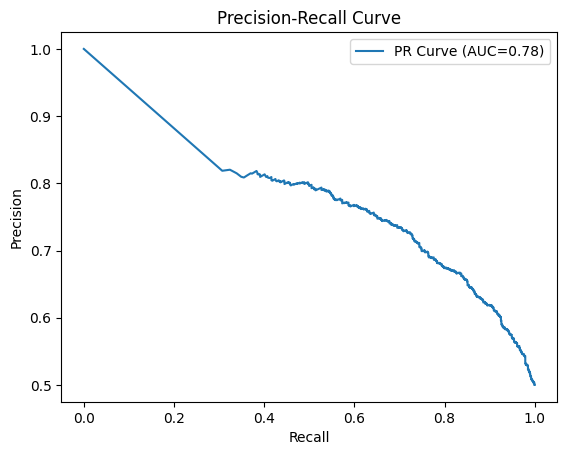

In [ ]:
from sklearn.metrics import precision_recall_curve, auc

def precision_recall_curve_analysis(model, dataset):
    y_true, y_prob = [], []
    for images, labels in dataset:
        probs = model.predict(images).flatten()
        y_true.extend(labels.numpy())
        y_prob.extend(probs)
    
    y_true = np.array(y_true)
    y_prob = np.array(y_prob)

    precision, recall, _ = precision_recall_curve(y_true, y_prob)
    pr_auc = auc(recall, precision)
    
    # Plot Precision-Recall Curve
    plt.plot(recall, precision, label=f"PR Curve (AUC={pr_auc:.2f})")
    plt.xlabel("Recall")
    plt.ylabel("Precision")
    plt.title("Precision-Recall Curve")
    plt.legend()
    plt.show()

precision_recall_curve_analysis(model, test_dataset)


 ### Explore Misclassified Example 

Number of misclassified examples: 566


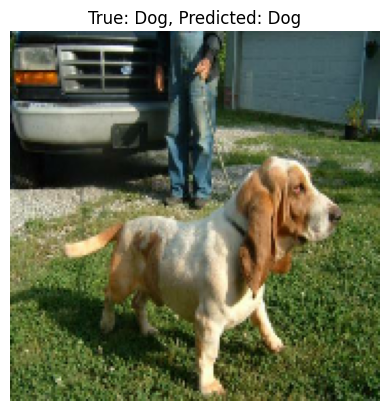

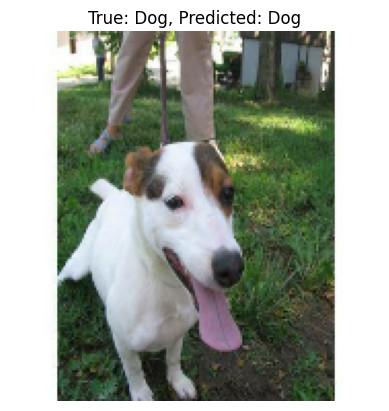

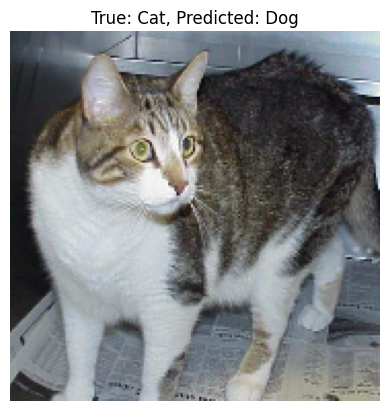

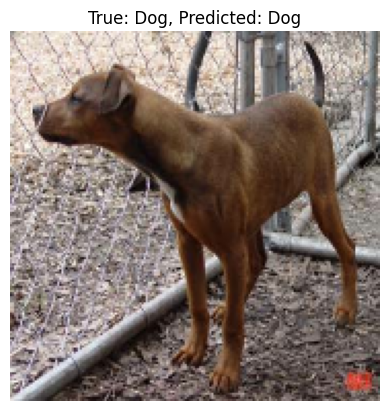

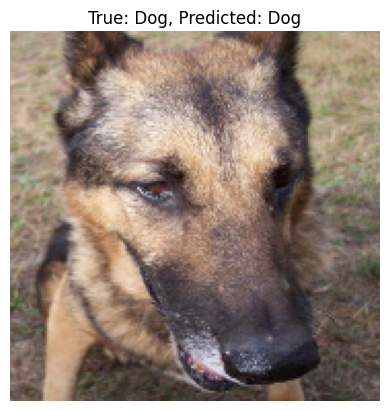

...

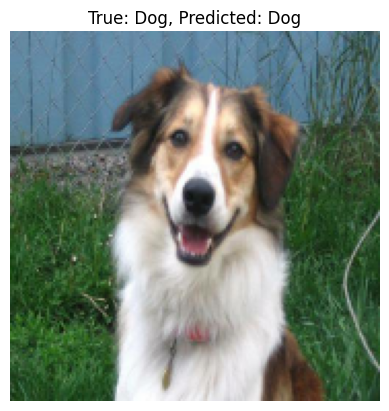

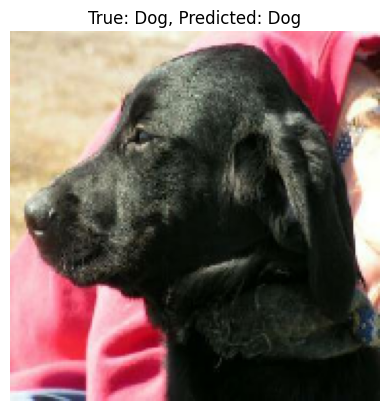

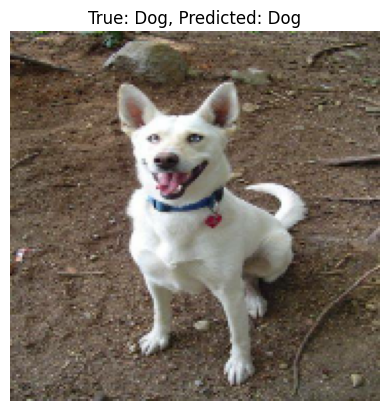

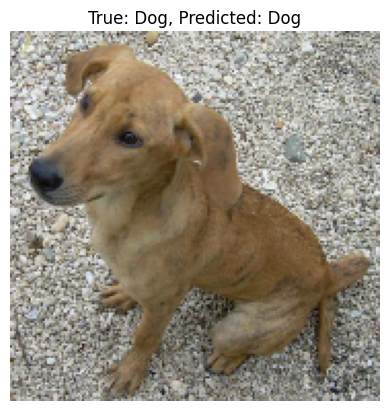

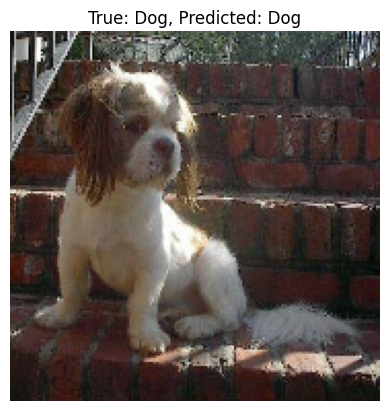

In [ ]:
def explore_misclassified_examples(y_true, y_pred, dataset):
    misclassified_indices = np.where(y_true != y_pred)[0]
    print(f"Number of misclassified examples: {len(misclassified_indices)}")
    
    # Display a few misclassified images
    for i in misclassified_indices[:5]:  # Show first 5 examples
        for images, labels in dataset.take(i+1):
            misclassified_image = images[0].numpy().astype("uint8")
            true_label = labels[0].numpy()
            predicted_label = y_pred[i]
            
            plt.imshow(misclassified_image)
            plt.title(f"True: {'Dog' if true_label == 1 else 'Cat'}, Predicted: {'Dog' if predicted_label == 1 else 'Cat'}")
            plt.axis("off")
            plt.show()

explore_misclassified_examples(y_true, y_pred, test_dataset)


### CONCLUSION
From the above analyses,

Accuracy and Confusion Matrix: Overall performance assessment and particular misclassifications-for example, more false positives or false negatives.

Precision, Recall, and F1-score: Summarize the model's performance in identifying the positive class, Dogs.

Precision-Recall Curve: This is done to evaluate trade-offs at different thresholds that yield the best balance between precision and recall.

Error Analysis Identify whether the model struggles with ambiguous images or features of specific type, for instance, small dogs or blurry cats.